# Model testing and final evaluation

## Overview

This notebook focuses on evaluating the performance of the previously trained garbage classification models. No additional training is performed at this stage. Instead, the saved models are loaded and used only for inference on unseen data.

The evaluation is divided into two phases:

#### Phase 1 – Real-world image testing

The first phase focuses on testing the model using real-life images collected during everyday situations while disposing of waste. These images were captured randomly and represent realistic conditions that differ from the original training dataset. The goal of this phase is to observe how well the model generalizes to real-world scenarios involving varying backgrounds, lighting conditions, and object positions.

#### Phase 2 – Hold-out test set evaluation

The second phase evaluates the model on the previously separated **15% hold-out test set**. This subset was isolated before cross-validation and was never used during training. Using this unseen dataset allows for a more objective assessment of model performance while preserving the original data distribution.

We start with import of libraries, as always.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import json
import torch
import torch.nn.functional as F
from PIL import Image
from transformers import AutoImageProcessor, AutoModelForImageClassification
from collections import defaultdict
from datasets import load_dataset
from PIL import Image, ImageOps

Training information was retrieved from the saved checkpoint folders generated during the training process. For each fold, the code reads the trainer_state.json file and extracts logged metrics collected during training. Two plots were created. The first plot presents training loss over training steps, showing how the model error changed during learning. A decreasing loss indicates that the model was gradually improving its ability to fit the training data. The second plot presents validation accuracy over epochs, allowing performance comparison across folds on unseen validation data.

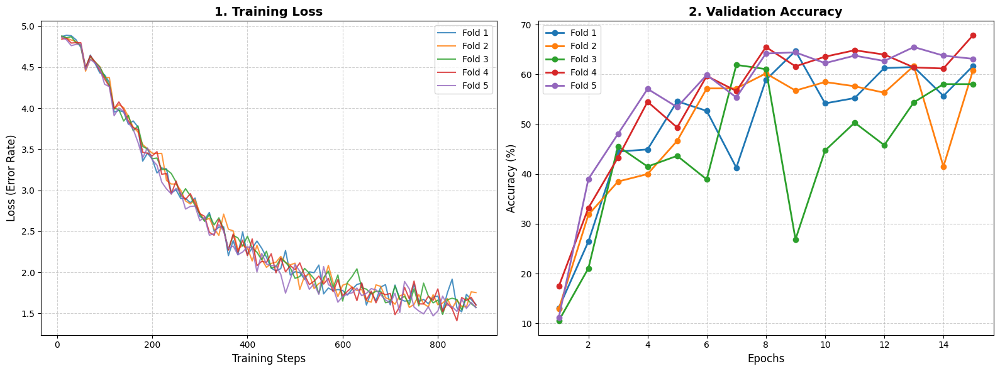

In [2]:
# 224x224 model 
plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

folds = 5
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i in range(1, folds + 1):
    fold_dir = f"./garbage_model_fold_{i}"

    if not os.path.exists(fold_dir):
        print(f"Could not find folder: {fold_dir}")
        continue

    # logs inside 'checkpoint-XXX' folders
    checkpoints = [d for d in os.listdir(fold_dir) if d.startswith("checkpoint")]
    if not checkpoints:
        print(f"No checkpoints found in {fold_dir}")
        continue

    checkpoints.sort(key=lambda x: int(x.split("-")[1]))
    latest_checkpoint = checkpoints[-1]

    state_path = os.path.join(fold_dir, latest_checkpoint, "trainer_state.json")

    if os.path.exists(state_path):
        with open(state_path, "r") as f:
            state = json.load(f)

        log_history = state["log_history"]

        # Loss for every 10 steps (logging_steps=10)
        train_steps = [log["step"] for log in log_history if "loss" in log]
        train_loss = [log["loss"] for log in log_history if "loss" in log]

        # Accuracy per each epoch
        eval_epochs = [log["epoch"] for log in log_history if "eval_accuracy" in log]
        eval_acc = [log["eval_accuracy"] * 100 for log in log_history if "eval_accuracy" in log] 

        ax1.plot(train_steps, train_loss, color=colors[i-1], alpha=0.8, label=f"Fold {i}")
        ax2.plot(eval_epochs, eval_acc, color=colors[i-1], marker='o', linewidth=2, label=f"Fold {i}")

# Training Loss
ax1.set_title("1. Training Loss", fontsize=14, fontweight='bold')
ax1.set_xlabel("Training Steps", fontsize=12)
ax1.set_ylabel("Loss (Error Rate)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.legend()

# Validation Accuracy 
ax2.set_title("2. Validation Accuracy", fontsize=14, fontweight='bold')
ax2.set_xlabel("Epochs", fontsize=12)
ax2.set_ylabel("Accuracy (%)", fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend()

plt.tight_layout()
plt.show()

Learning rates for all 5 folds are quite smooth. It proves that our 5e-5 learning rate and our warmup_ratio=0.1 were the good settings for fine-tuning the EfficientNet. Taking into consideration convergence, by the end of the steps (around the 500 mark), the lines flatten out near the bottom. This means the model has squeezed almost all the useful information it can out of the training data.

Looking at the Validation Accuracy chart, all five folds start low (around 20-40%) and climb steadily together up to the 60-70% range. Average Accuracy across all 5 folds is 64.36% and standard deviation around 2.31%. The number of epochs between 10 and 15 was alos a good choice. The lines for the different folds plateau arond the 10th epoch and mostly keep this level of accuracy till epoch 15. 

Based on the graphs, we can conclude that 224x224 model is robust and learning consistently across every possible slice of the dataset. 

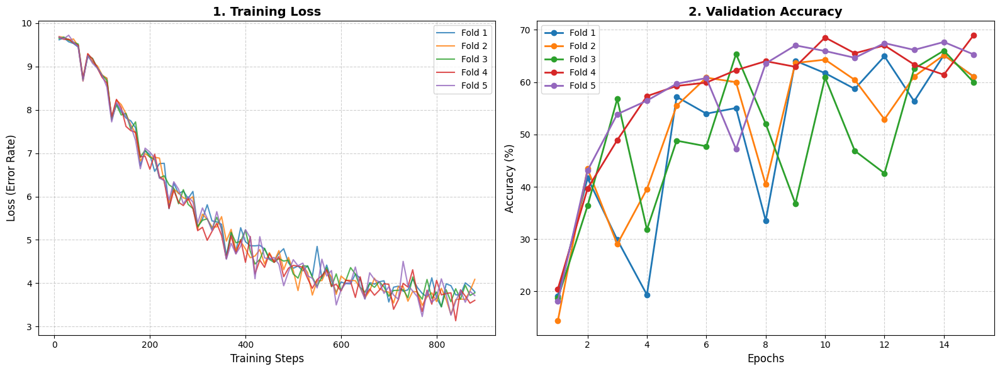

In [3]:
# 448x448 model
plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

folds = 5
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i in range(1, folds + 1):
    fold_dir = f"./garbage_model_448_fold_{i}"

    if not os.path.exists(fold_dir):
        print(f"Could not find folder: {fold_dir}")
        continue

    # logs inside 'checkpoint-XXX' folders
    checkpoints = [d for d in os.listdir(fold_dir) if d.startswith("checkpoint")]
    if not checkpoints:
        print(f"No checkpoints found in {fold_dir}")
        continue

    checkpoints.sort(key=lambda x: int(x.split("-")[1]))
    latest_checkpoint = checkpoints[-1]

    state_path = os.path.join(fold_dir, latest_checkpoint, "trainer_state.json")

    if os.path.exists(state_path):
        with open(state_path, "r") as f:
            state = json.load(f)

        log_history = state["log_history"]

        # Loss for every 10 steps (logging_steps=10)
        train_steps = [log["step"] for log in log_history if "loss" in log]
        train_loss = [log["loss"] for log in log_history if "loss" in log]

        # Accuracy per each epoch
        eval_epochs = [log["epoch"] for log in log_history if "eval_accuracy" in log]
        eval_acc = [log["eval_accuracy"] * 100 for log in log_history if "eval_accuracy" in log] 

        ax1.plot(train_steps, train_loss, color=colors[i-1], alpha=0.8, label=f"Fold {i}")
        ax2.plot(eval_epochs, eval_acc, color=colors[i-1], marker='o', linewidth=2, label=f"Fold {i}")

# Training Loss
ax1.set_title("1. Training Loss", fontsize=14, fontweight='bold')
ax1.set_xlabel("Training Steps", fontsize=12)
ax1.set_ylabel("Loss (Error Rate)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.legend()

# Validation Accuracy 
ax2.set_title("2. Validation Accuracy", fontsize=14, fontweight='bold')
ax2.set_xlabel("Epochs", fontsize=12)
ax2.set_ylabel("Accuracy (%)", fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend()

plt.tight_layout()
plt.show()

Now lets analyze the training process for the model with increased resolution to 448x448. The same as 224x224 model, the training loss drops fast and smooth, approaching near-zero very quickly. This tells us the model had no problem memorizing the training data. The higher resolution gave it so much detail that it easily found unique features for every single image.

However, we can notice a claer difference for the accuracy scores acros the folds and epochs. Average Accuracy across all 5 folds is 66.60% and standard deviation around 1.50%. Notice how the accuracy peaks early (around epochs 2-4) mostly for the folds 1,2 and 3, hitting roughly 60-70%. But then, as training continues, the accuracy drops and becomes unstable. This could happen because the model was given so much fine detail, it started memorizing noise and specific quirks of the training images (like the exact background of a specific bottle) rather than learning the general shapes of the garbage. When it was tested on the validation set, those hyper-specific details weren't there, so its guesses became worse. If we Look at the wide spread between the lines compared to the tight grouping of your 224x224 model, fold 3 (green) crashes down to below 65%, while Fold 4 (red) stays near 70%. This instability is a major warning sign that the model is no longer generalizing well.

### Testing on real images

After evaluating the model during cross-validation, an additional testing phase was performed using real-world images. The purpose of this experiment was to assess how the trained **224×224 model** behaves in more realistic conditions outside the original dataset.

The images were collected during everyday waste disposal situations and intentionally represented natural conditions rather than controlled dataset examples. They included variations in  lighting, object orientation, and image quality. This created a more challenging environment and allowed observation of the model's ability to generalize to previously unseen scenarios.

It should be noted that the real-world dataset consisted of only 21 images, therefore this experiment serves primarily as an exploratory demonstration rather than a statistically reliable performance evaluation.

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Model loaded

Found 21 real-world images. Starting classification...

test1.jpg:
Model says: HARD PLASTIC (45.85% confident)

test10.jpeg:
Model says: SOFT PLASTICS (38.02% confident)

test11.jpeg:
Model says: SOFT PLASTICS (50.02% confident)

test12.jpeg:
Model says: SOFT PLASTICS (29.94% confident)

test13.jpeg:
Model says: SOFT PLASTICS (60.59% confident)

test14.jpeg:
Model says: TAKEAWAY CUPS (51.43% confident)

test15.jpeg:
Model says: SOFT PLASTICS (15.21% confident)

test16.jpeg:
Model says: TAKEAWAY CUPS (52.78% confident)

test17.jpeg:
Model says: PAPER TOWEL (30.91% confident)

test18.jpeg:
Model says: PAPER (22.63% confident)

test19.jpeg:
Model says: SOFT PLASTICS (48.95% confident)

test2.jpg:
Model says: PAPER TOWEL (31.34% confident)

test20.jpeg:
Model says: TAKEAWAY CUPS (29.70% confident)

test21.jpeg:
Model says: GLASS (68.28% confident)

test3.jpg:
Model says: SOFT PLASTICS (51.48% confident)

test4.jpg:
Model says: GLASS (41.69% confident)

test5.jpg:
Model says: 

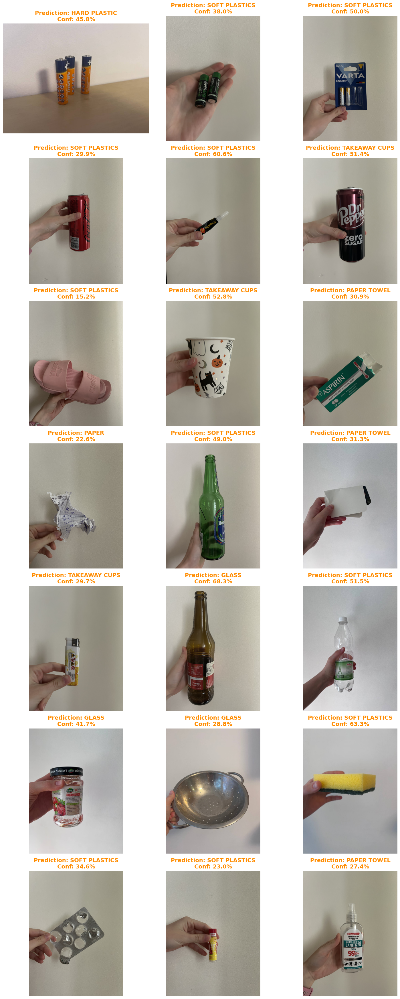

In [2]:
model_path_224 = "./best_garbage_classifier"
test_folder = "./real_images_test"

processor = AutoImageProcessor.from_pretrained(model_path_224)
model = AutoModelForImageClassification.from_pretrained(model_path_224)

print("Model loaded\n")

if not os.path.exists(test_folder):
    print(f"Error: Could not find the folder '{test_folder}'")
    exit()

valid_extensions = (".jpg", ".jpeg", ".png", ".webp")

image_files = sorted([
    f for f in os.listdir(test_folder)
    if f.lower().endswith(valid_extensions)
])

if len(image_files) == 0:
    print(f"Error: Found the folder '{test_folder}', but there are no images inside it")
    exit()

print(f"Found {len(image_files)} real-world images. Starting classification...\n")

num_images = len(image_files)

cols = 3
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))

for i, filename in enumerate(image_files):

    image_path = os.path.join(test_folder, filename)

    # Open image and automatically fix orientation
    raw_image = Image.open(image_path)
    raw_image = ImageOps.exif_transpose(raw_image)
    raw_image = raw_image.convert("RGB")

    # Prepare image
    inputs = processor(
        raw_image,
        return_tensors="pt"
    )

    # Prediction only
    with torch.no_grad():
        outputs = model(**inputs)

    probabilities = F.softmax(outputs.logits, dim=1)[0]

    best_prediction_id = torch.argmax(
        probabilities
    ).item()

    confidence = (
        probabilities[best_prediction_id].item() * 100
    )

    predicted_label = model.config.id2label[
        best_prediction_id
    ]

    print(f"{filename}:")
    print(
        f"Model says: {predicted_label.upper()} "
        f"({confidence:.2f}% confident)\n"
    )

    plt.subplot(rows, cols, i + 1)

    plt.imshow(raw_image)

    plt.axis("off")

    title_color = (
        "green"
        if confidence > 70
        else "darkorange"
    )

    plt.title(
        f"Prediction: {predicted_label.upper()}\n"
        f"Conf: {confidence:.1f}%",
        fontsize=14,
        fontweight='bold',
        color=title_color
    )

plt.tight_layout()
plt.show()

The real-world evaluation results show that the 224×224 model was able to generate meaningful predictions; however, performance varied considerably depending on the object type. Confidence scores were generally lower than those observed during testing on the original dataset, suggesting that real-life conditions introduced additional challenges for the model.

The model performed relatively well for visually distinctive objects such as glass bottles, jars, and takeaway cups, where confidence values reached around 50–68%. This suggests that categories with more unique shapes and textures were easier for the model to recognize.

However, several objects were incorrectly classified or assigned low confidence values. Categories such as batteries, soft plastics, hard plastic and paper-related items frequently caused confusion. A noticeable pattern is that the model often predicted soft plastics, indicating a tendency to assign uncertain examples to visually broad categories. Many misclassifications can be explained by similarities in shape, texture or material appearance. For example, cans, batteries, plastic containers and packaging materials often share reflective surfaces or similar object structures. Additionally, the real-world images contained backgrounds, hand positions, and viewing angles that differed from the original training data.

Overall, these results suggest that the model learned useful visual representations and demonstrated some ability to generalize outside the original dataset. However, the relatively low confidence scores and frequent confusion between similar classes indicate that additional real-world examples and greater image diversity would likely improve performance.

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Model loaded

Found 21 real-world images. Starting classification...

test1.jpg:
Model says: SOFT PLASTICS (22.92% confident)

test10.jpeg:
Model says: SOFT PLASTICS (21.27% confident)

test11.jpeg:
Model says: HARD PLASTIC (22.77% confident)

test12.jpeg:
Model says: TAKEAWAY CUPS (18.85% confident)

test13.jpeg:
Model says: SOFT PLASTICS (37.19% confident)

test14.jpeg:
Model says: TAKEAWAY CUPS (96.37% confident)

test15.jpeg:
Model says: PAPER TOWEL (14.70% confident)

test16.jpeg:
Model says: TAKEAWAY CUPS (87.63% confident)

test17.jpeg:
Model says: SOFT PLASTICS (19.55% confident)

test18.jpeg:
Model says: PAPER (17.75% confident)

test19.jpeg:
Model says: GLASS (76.47% confident)

test2.jpg:
Model says: PAPER (20.68% confident)

test20.jpeg:
Model says: PAPER TOWEL (20.36% confident)

test21.jpeg:
Model says: GLASS (61.31% confident)

test3.jpg:
Model says: GLASS (47.32% confident)

test4.jpg:
Model says: TAKEAWAY CUPS (33.52% confident)

test5.jpg:
Model says: GLASS (35.14% co

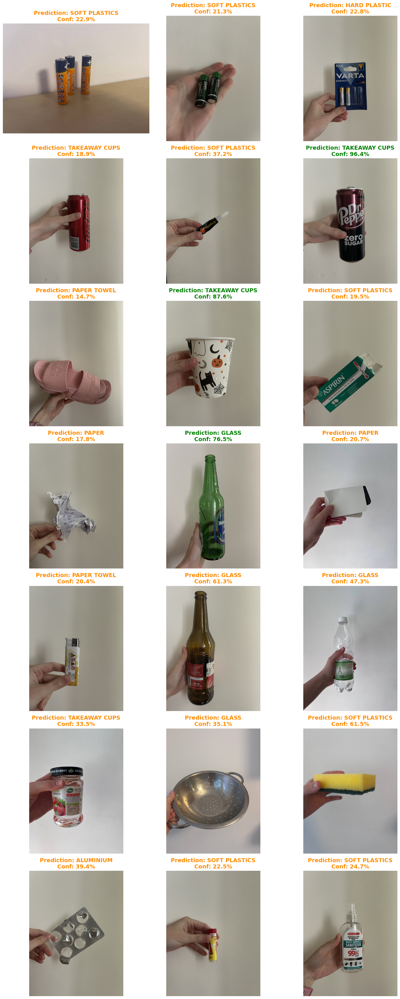

In [1]:
model_path_448 = "./model_448px_experiment"
test_folder = "./real_images_test"

processor = AutoImageProcessor.from_pretrained(model_path_448)
model = AutoModelForImageClassification.from_pretrained(model_path_448)

print("Model loaded\n")

if not os.path.exists(test_folder):
    print(f"Error: Could not find the folder '{test_folder}'")
    exit()

valid_extensions = (".jpg", ".jpeg", ".png", ".webp")

image_files = sorted([
    f for f in os.listdir(test_folder)
    if f.lower().endswith(valid_extensions)
])

if len(image_files) == 0:
    print(f"Error: Found the folder '{test_folder}', but there are no images inside it")
    exit()

print(f"Found {len(image_files)} real-world images. Starting classification...\n")

num_images = len(image_files)

cols = 3
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))

for i, filename in enumerate(image_files):

    image_path = os.path.join(test_folder, filename)

    # Open image and fix phone orientation metadata
    raw_image = Image.open(image_path)
    raw_image = ImageOps.exif_transpose(raw_image)
    raw_image = raw_image.convert("RGB")

    # Preprocess image
    inputs = processor(
        raw_image,
        return_tensors="pt"
    )

    # Prediction only
    with torch.no_grad():
        outputs = model(**inputs)

    probabilities = F.softmax(outputs.logits, dim=1)[0]

    best_prediction_id = torch.argmax(
        probabilities
    ).item()

    confidence = (
        probabilities[best_prediction_id].item() * 100
    )

    predicted_label = model.config.id2label[
        best_prediction_id
    ]

    print(f"{filename}:")
    print(
        f"Model says: {predicted_label.upper()} "
        f"({confidence:.2f}% confident)\n"
    )

    plt.subplot(rows, cols, i + 1)

    plt.imshow(raw_image)

    plt.axis("off")

    title_color = (
        "green"
        if confidence > 70
        else "darkorange"
    )

    plt.title(
        f"Prediction: {predicted_label.upper()}\n"
        f"Conf: {confidence:.1f}%",
        fontsize=14,
        fontweight='bold',
        color=title_color
    )

plt.tight_layout()
plt.show()

The real-world evaluation of the **448×448 model** showed mixed results. Although the model had access to higher-resolution images and more visual detail, this did not consistently improve prediction quality. Similar to observations from the training stage, increasing image resolution did not automatically translate into better real-world performance.

Some objects with distinctive visual characteristics, such as glass bottles and takeaway cups were classified correctly with relatively high confidence scores. For example, several predictions reached confidence values above 75–90%, suggesting that the model could recognize categories with strong visual patterns. In some cases, confidence scores were higher than those observed for the 224×224 model. However, many examples remained difficult to classify correctly. Categories such as batteries, plastic containers and packaging materials were frequently confused with soft plastics, paper towel or takeaway cups. Similar to the previous experiment, the model showed a tendency to assign uncertain examples to broad categories.

An important observation is that despite having access to more image detail, the 448×448 model did not demonstrate more stable behaviour. Some predictions were highly confident, while others remained uncertain or incorrect. This inconsistency supports earlier training results suggesting that the model may have focused too strongly on fine details and image-specific patterns rather than learning more general object characteristics.

### Testing on the test dataset

To perform a final evaluation, the previously separated 15% hold-out test set was used. This subset had been isolated before the cross-validation stage and was never included during training, ensuring that the evaluation was performed on genuinely unseen images.

The code first recreates the original train–test split using the same stratified sampling strategy and fixed random seed (seed=42). Using the same seed guarantees reproducibility and reconstructs the exact test subset used during the original experiment.

Next, the saved model (best_garbage_classifier) and its corresponding image processor are loaded. No retraining is performed, the model is used only in inference mode. Each image from the unseen test set is preprocessed and passed through the classifier to generate predictions. 

For each sample, the predicted label is compared with the true label, and the number of correct predictions is recorded. Final accuracy is then computed as the proportion of correctly classified images relative to the total number of test samples.

In [6]:
# Recreate original split
data_dir = "./trash_images"

dataset = load_dataset("imagefolder", data_dir=data_dir)
data = dataset["train"]

split_data = data.train_test_split(
    test_size=0.15,
    stratify_by_column="label",
    seed=42
)

test = split_data["test"]

# Load trained model
model_path = "./best_garbage_classifier"

processor = AutoImageProcessor.from_pretrained(model_path)
model = AutoModelForImageClassification.from_pretrained(model_path)

id2label = model.config.id2label

# Evaluate unseen images
correct = 0

for sample in test:

    image = sample["image"]
    true_label = id2label[sample["label"]]

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    with torch.no_grad():
        outputs = model(**inputs)

    pred = outputs.logits.argmax(-1).item()
    pred_label = id2label[pred]

    if pred_label == true_label:
        correct += 1

accuracy = correct / len(test)

print("Final Test Accuracy:", accuracy)

Resolving data files:   0%|          | 0/2734 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Final Test Accuracy: 0.708029197080292


The model achieved a final test accuracy of 70.8%, meaning it correctly classified around 7 out of 10 images. This result suggests that the model learned meaningful patterns and was able to generalize reasonably well to unseen examples from the original dataset.

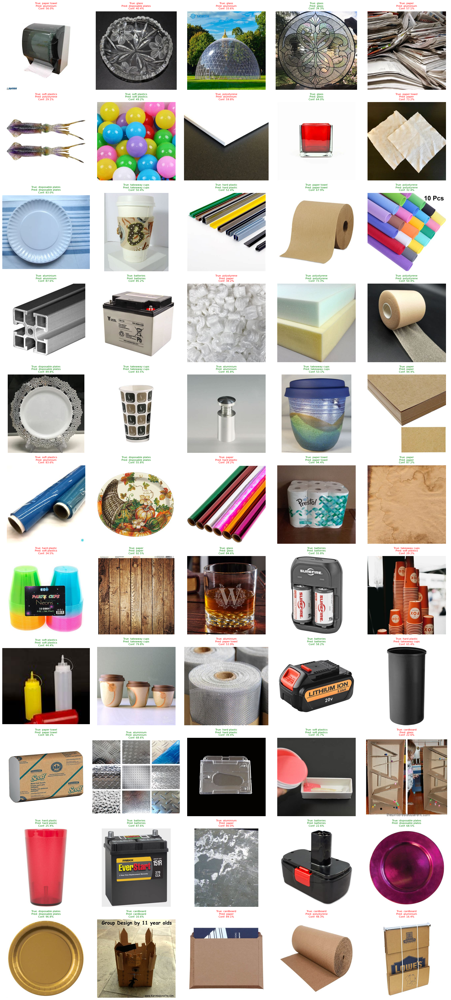

In [7]:
shown_per_class = defaultdict(int)
max_images_per_class = 5

selected_images = []

for sample in test:

    true_label = id2label[sample["label"]]

    if shown_per_class[true_label] >= max_images_per_class:
        continue

    image = sample["image"]

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    with torch.no_grad():
        outputs = model(**inputs)

    probs = F.softmax(outputs.logits, dim=-1)

    pred_idx = probs.argmax(-1).item()
    pred_label = id2label[pred_idx]
    confidence = probs[0][pred_idx].item() * 100

    selected_images.append(
        (image, true_label, pred_label, confidence)
    )

    shown_per_class[true_label] += 1

    if all(
        count >= max_images_per_class
        for count in shown_per_class.values()
    ):
        break


# Plot all images together
num_images = len(selected_images)
cols = 5
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(20, 4 * rows))

for i, (image, true_label, pred_label, confidence) in enumerate(selected_images):

    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.axis("off")

    color = "green" if true_label == pred_label else "red"

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {pred_label}\n"
        f"Conf: {confidence:.1f}%",
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()

The results show that the model performs relatively well for categories with distinctive visual characteristics, particularly glass, paper towel, cardboard, and some takeaway cup examples. Several glass-related objects, such as the stained glass window, glass dome structure, red glass container, and whiskey glass, were correctly identified with relatively high confidence scores. Similarly, paper-related examples such as toilet paper rolls, paper towels, and wood/cardboard textures were frequently classified correctly. Some takeaway cup examples, including decorated coffee cups were also recognized successfully.

However, several categories remained challenging. Misclassifications frequently occurred among visually similar classes, especially soft plastics, hard plastic, paper, and paper towel. For example, plastic drinking straws were classified as hard plastic, while colorful foam sheets and foam packaging materials were sometimes confused with polystyrene. Similarly, some paper cups and disposable cups were incorrectly predicted as paper-related categories rather than takeaway cups.

The model also occasionally struggled to distinguish between material-based and object-based classes. For example, battery-related objects, including both standard batteries and larger battery packs, were sometimes confused with unrelated categories. Packaging materials and containers also caused confusion. Certain plastic objects, such as storage containers or wrapped products, appeared visually similar to soft plastics due to shape or texture characteristics.

Confidence scores varied considerably across examples, indicating differences in prediction certainty. Images with clear object boundaries and simple backgrounds generally produced stronger confidence values. In contrast, visually complex examples or images containing repetitive textures, reflections, or unusual object structures often resulted in lower confidence scores and increased classification errors. This suggests that the model relies strongly on visual appearance and may struggle when different categories share overlapping patterns or material properties.

## Summary

The main objective of this project was to develop an image classification system capable of recognizing different categories of garbage using deep learning techniques. The project focused on classifying waste into 11 categories, including materials such as glass, cardboard, plastics, batteries, and takeaway items. The motivation behind the project was the growing importance of proper waste segregation and the potential role of artificial intelligence in supporting more efficient recycling processes.

During the project, transfer learning was applied using an EfficientNet-based image classification model. A stratified train–test split was created, and 5-fold cross-validation was used to improve model evaluation and reduce the risk of overfitting. Two image resolutions, **224×224** and **448×448**, were tested to investigate whether higher-resolution inputs could improve classification performance.

The experiments showed that increasing image resolution did not necessarily lead to better results. Although the 448×448 model achieved very low training loss, it showed signs of overfitting and less stable validation performance. In contrast, the **224×224 model** demonstrated more consistent behaviour and better generalization across folds.

Model performance was evaluated in two ways: using real-world images and using a previously separated unseen hold-out test set. Testing on real-life examples showed that the model was able to produce meaningful predictions, although confidence scores were often lower due to differences in image quality, backgrounds, and object appearance. Evaluation on the unseen test set resulted in a final accuracy of approximately **70.8%**, indicating that the model successfully learned relevant visual patterns and generalized reasonably well to new data.

Overall, the project demonstrated that deep learning can be effectively applied to waste classification problems. At the same time, the results highlighted challenges related to visually similar categories and real-world variability. Future improvements could include expanding the dataset, balancing difficult classes, and increasing the diversity of training examples to improve robustness and classification accuracy.

## Resources

1. Materials from "Image Recognition" lab classes 
2. https://huggingface.co/transformers/v3.0.2/model_doc/auto.html <br>
3. https://huggingface.co/docs/transformers/model_doc/auto <br>
4. https://huggingface.co/datasets/viola77data/recycling-dataset <br>
5. https://huggingface.co/google/efficientnet-b0 <br>
6. https://github.com/tensorflow/tpu/blob/master/models/official/efficientnet/README.md <br>
7. https://huggingface.co/docs/transformers/main_classes/trainer
